# fine_tune_keras_yolov8

### Keras YOLOv8

https://www.kaggle.com/models/keras/yolov8

https://www.kaggle.com/models/keras/yolov8/keras/yolo_v8_l_backbone

https://keras.io/examples/vision/yolov8/

## Tutorial from


Fine tunning with Keras [Object Detection with KerasCV](https://colab.research.google.com/github/keras-team/keras-io/blob/master/guides/ipynb/keras_cv/object_detection_keras_cv.ipynb#scrollTo=61sCS830dIz_)

Another similar tutorial
[Efficient Object Detection with YOLOV8 and KerasCV](https://colab.research.google.com/github/keras-team/keras-io/blob/master/examples/vision/ipynb/yolov8.ipynb)

https://colab.research.google.com/drive/1wLfukN6AKkBCS8X5iTnYjURlYblUmxPF

### Other References

https://www.youtube.com/watch?v=vCT5rFrERaI

https://github.com/spmallick/learnopencv/tree/master/Object-Detection-using-KerasCV-YOLOv8

https://github.com/spmallick/learnopencv/tree/master





In [ ]:
!pip install -q keras_core
!pip install -q keras_cv

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.7/650.7 kB 3.0 MB/s eta 0:00:00


## Packages Import

In [ ]:
import os
os.environ["KERAS_BACKEND"] = "tensorflow"  # Or "jax" or "torch"!

import tensorflow as tf
import keras_cv
import tensorflow_datasets as tfds
import keras

Using TensorFlow backend


## Dev env packages import

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import zipfile


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue May 21 14:50:05 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# YOLOV8 and KerasCV Finetunning

In [ ]:
import os
from tqdm.auto import tqdm
import xml.etree.ElementTree as ET

import tensorflow as tf
from tensorflow import keras

import keras_cv
from keras_cv import bounding_box
from keras_cv import visualization

## Hyperparameters

In [ ]:
SPLIT_RATIO = 0.3
BATCH_SIZE = 4
LEARNING_RATE = 0.001
EPOCHS = 50
GLOBAL_CLIPNORM = 10.0

## Load dataset

In [ ]:
# Unpacking dataset
local_zip = "/content/pascal_voc_xml.zip"

zip_ref = zipfile.ZipFile(local_zip, "r")
zip_ref.extractall("/content/dataset")
zip_ref.close()

In [ ]:
class_ids = [
    "carros",
    "motos",
]
class_mapping = dict(zip(range(len(class_ids)), class_ids))

# Path to images and annotations
path_images = "/content/dataset/images"
path_annot = "/content/dataset/Annotations"

# Get all XML file paths in path_annot and sort them
xml_files = sorted(
    [
        os.path.join(path_annot, file_name)
        for file_name in os.listdir(path_annot)
        if file_name.endswith(".xml")
    ]
)

# Get all JPEG image file paths in path_images and sort them
jpg_files = sorted(
    [
        os.path.join(path_images, file_name)
        for file_name in os.listdir(path_images)
        if file_name.endswith(".jpg")
    ]
)

The function below reads the XML file and finds the image name and path, and then iterates over each object in the XML file to extract the bounding box coordinates and class labels for each object

In [ ]:

def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    image_name = root.find("filename").text
    image_path = os.path.join(path_images, image_name)

    boxes = []
    classes = []
    for obj in root.iter("object"):
        cls = obj.find("name").text
        classes.append(cls)

        bbox = obj.find("bndbox")
        xmin = float(bbox.find("xmin").text)
        ymin = float(bbox.find("ymin").text)
        xmax = float(bbox.find("xmax").text)
        ymax = float(bbox.find("ymax").text)
        boxes.append([xmin, ymin, xmax, ymax])

    class_ids = [
        list(class_mapping.keys())[list(class_mapping.values()).index(cls)]
        for cls in classes
    ]
    return image_path, boxes, class_ids


image_paths = []
bbox = []
classes = []
for xml_file in tqdm(xml_files):
    image_path, boxes, class_ids = parse_annotation(xml_file)
    image_paths.append(image_path)
    bbox.append(boxes)
    classes.append(class_ids)

  0%|          | 0/57 [00:00<?, ?it/s]

Here we are using `tf.ragged.constant` to create ragged tensors from the `bbox` and
`classes` lists. A ragged tensor is a type of tensor that can handle varying lengths of
data along one or more dimensions. This is useful when dealing with data that has
variable-length sequences,

In [ ]:
bbox = tf.ragged.constant(bbox)
classes = tf.ragged.constant(classes)
image_paths = tf.ragged.constant(image_paths)

data = tf.data.Dataset.from_tensor_slices((image_paths, classes, bbox))

Splitting data in training and validation data

In [ ]:
# Determine the number of validation samples
num_val = int(len(xml_files) * SPLIT_RATIO)

# Split the dataset into train and validation sets
val_data = data.take(num_val)
train_data = data.skip(num_val)

In [ ]:

def load_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    return image


def load_dataset(image_path, classes, bbox):
    # Read Image
    image = load_image(image_path)
    bounding_boxes = {
        "classes": tf.cast(classes, dtype=tf.float32),
        "boxes": bbox,
    }
    return {"images": tf.cast(image, tf.float32), "bounding_boxes": bounding_boxes}


### Data Augmentation

https://keras.io/api/keras_cv/layers/

https://keras.io/api/layers/preprocessing_layers/image_augmentation/

In [ ]:
augmenter = keras.Sequential(
    layers=[
        keras_cv.layers.RandomFlip(
            mode="horizontal",
            bounding_box_format="xyxy",
        ),
        keras_cv.layers.RandomShear(
            x_factor=0.2,
            y_factor=0.2,
            bounding_box_format="xyxy"
        ),
        keras_cv.layers.RandomBrightness(
            factor=0.2,
        ),
        keras_cv.layers.RandomCrop(
            640,
            640,
            bounding_box_format="xyxy"
        ),
        keras_cv.layers.JitteredResize(
            target_size=(640, 640),
            scale_factor=(0.75, 1.3),
            bounding_box_format="xyxy"
        ),
    ]
)

## Creating Training Dataset

In [ ]:
# El data augmentation se hace despues de separar los datos porque esta es la forma correcta
train_ds = train_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.shuffle(BATCH_SIZE * 4)
train_ds = train_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
train_ds = train_ds.map(augmenter, num_parallel_calls=tf.data.AUTOTUNE)

## Creating Validation Dataset

In [ ]:
resizing = keras_cv.layers.JitteredResize(
    target_size=(640, 640),
    scale_factor=(0.75, 1.3),
    bounding_box_format="xyxy",
)

val_ds = val_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.shuffle(BATCH_SIZE * 4)
val_ds = val_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
val_ds = val_ds.map(resizing, num_parallel_calls=tf.data.AUTOTUNE)

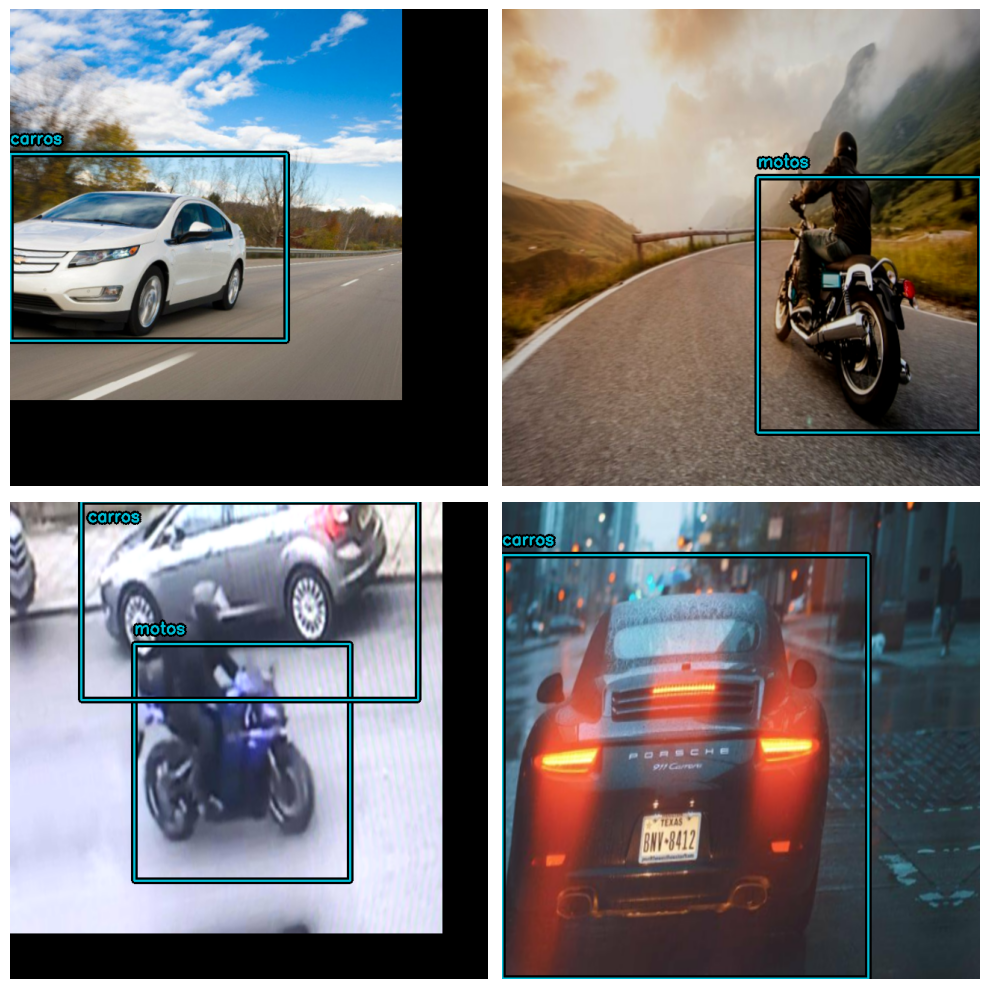

In [ ]:

def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.7,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
    )


visualize_dataset(
    train_ds, bounding_box_format="xyxy", value_range=(0, 255), rows=2, cols=2
)



We need to extract the inputs from the preprocessing dictionary and get them ready to be
fed into the model.

In [ ]:

def dict_to_tuple(inputs):
    return inputs["images"], inputs["bounding_boxes"]


train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)

val_ds = val_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

First we will create a instance of backbone which will be used by our yolov8 detector
class.

YOLOV8 Backbones available in KerasCV:

1.   Without Weights:

    1.   yolo_v8_xs_backbone
    2.   yolo_v8_s_backbone
    3.   yolo_v8_m_backbone
    4.   yolo_v8_l_backbone
    5.   yolo_v8_xl_backbone

2. With Pre-trained coco weight:

    1.   yolo_v8_xs_backbone_coco
    2.   yolo_v8_s_backbone_coco
    2.   yolo_v8_m_backbone_coco
    2.   yolo_v8_l_backbone_coco
    2.   yolo_v8_xl_backbone_coco

For more flavors check https://www.kaggle.com/models/keras/yolov8

In [ ]:
yolo_backbone_keras = "yolo_v8_xs_backbone_coco" # We will use yolov8 extra small backbone with coco weights

In [ ]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xyxy",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2,
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.7,
)
backbone = keras_cv.models.YOLOV8Backbone.from_preset(
    yolo_backbone_keras,
)

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids


https://keras.io/api/keras_cv/models/tasks/yolo_v8_detector/

In [ ]:
yolo8 = keras_cv.models.YOLOV8Detector(
    num_classes=len(class_mapping),
    bounding_box_format="xyxy",
    backbone=backbone,
    fpn_depth=1,
    prediction_decoder=prediction_decoder,
)

## Compile the Model

In [ ]:
optimizer = tf.keras.optimizers.Adam(
    learning_rate=LEARNING_RATE,
    global_clipnorm=GLOBAL_CLIPNORM,
)

yolo8.compile(
    optimizer=optimizer,
    classification_loss="binary_crossentropy",
    box_loss="ciou",
)

## My callbacks

https://www.tensorflow.org/tensorboard/get_started

```
%tensorboard --logdir logs/fit
```

In [ ]:
import datetime
callback_early = tf.keras.callbacks.EarlyStopping(
    monitor="loss", # metrica a evaluar
    patience=8, # cantidad de epochs que si la metrica no mejora tras N epochs el entramiento se detiene
    mode="auto", # puede ser: min,max, auto
)

callback_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    '/content/models',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    mode='auto',
)

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
# %tensorboard --logdir logs/fit
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1,
  )


## FIT the model

In [ ]:
yolo8.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=[
        callback_early,
        callback_checkpoint,
        tensorboard_callback,
    ],
)

Epoch 1/50
10/10 [==============================] - ETA: 0s - loss: 516.2836 - box_loss: 2.8052 - class_loss: 513.4784

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:4

10/10 [==============================] - 107s 5s/step - loss: 516.2836 - box_loss: 2.8052 - class_loss: 513.4784 - val_loss: 11158.5879 - val_box_loss: 4.2505 - val_class_loss: 11154.3369
Epoch 2/50
10/10 [==============================] - 16s 1s/step - loss: 269.7770 - box_loss: 2.7840 - class_loss: 266.9930 - val_loss: 19765.8418 - val_box_loss: 4.5956 - val_class_loss: 19761.2461
Epoch 3/50
10/10 [==============================] - 15s 1s/step - loss: 220.1443 - box_loss: 2.8536 - class_loss: 217.2907 - val_loss: 49590.3047 - val_box_loss: 3.2899 - val_class_loss: 49587.0117
Epoch 4/50
10/10 [==============================] - 15s 1s/step - loss: 168.6656 - box_loss: 2.6494 - class_loss: 166.0162 - val_loss: 17279.6250 - val_box_loss: 4.1662 - val_class_loss: 17275.4590
Epoch 5/50
10/10 [==============================] - ETA: 0s - loss: 120.4009 - box_loss: 2.6150 - class_loss: 117.7859

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 48s 5s/step - loss: 120.4009 - box_loss: 2.6150 - class_loss: 117.7859 - val_loss: 161.7413 - val_box_loss: 4.4346 - val_class_loss: 157.3067
Epoch 6/50
10/10 [==============================] - ETA: 0s - loss: 82.3770 - box_loss: 2.8653 - class_loss: 79.5117

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 49s 5s/step - loss: 82.3770 - box_loss: 2.8653 - class_loss: 79.5117 - val_loss: 69.5343 - val_box_loss: 3.9220 - val_class_loss: 65.6122
Epoch 7/50
10/10 [==============================] - ETA: 0s - loss: 72.1107 - box_loss: 3.1098 - class_loss: 69.0008

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 50s 5s/step - loss: 72.1107 - box_loss: 3.1098 - class_loss: 69.0008 - val_loss: 65.7506 - val_box_loss: 3.4118 - val_class_loss: 62.3388
Epoch 8/50
10/10 [==============================] - 15s 1s/step - loss: 42.3040 - box_loss: 2.8449 - class_loss: 39.4592 - val_loss: 163.0686 - val_box_loss: 3.2703 - val_class_loss: 159.7983
Epoch 9/50
10/10 [==============================] - ETA: 0s - loss: 30.4736 - box_loss: 2.9911 - class_loss: 27.4825

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 49s 5s/step - loss: 30.4736 - box_loss: 2.9911 - class_loss: 27.4825 - val_loss: 65.7466 - val_box_loss: 3.3856 - val_class_loss: 62.3610
Epoch 10/50
10/10 [==============================] - 15s 1s/step - loss: 22.6024 - box_loss: 2.7259 - class_loss: 19.8765 - val_loss: 5367.0864 - val_box_loss: 4.6512 - val_class_loss: 5362.4346
Epoch 11/50
10/10 [==============================] - 15s 1s/step - loss: 15.8610 - box_loss: 2.9092 - class_loss: 12.9517 - val_loss: 4050.7917 - val_box_loss: 4.7975 - val_class_loss: 4045.9941
Epoch 12/50
10/10 [==============================] - 15s 1s/step - loss: 11.0149 - box_loss: 2.8395 - class_loss: 8.1753 - val_loss: 186.3064 - val_box_loss: 3.7428 - val_class_loss: 182.5636
Epoch 13/50
10/10 [==============================] - ETA: 0s - loss: 8.5486 - box_loss: 2.7402 - class_loss: 5.8085

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 48s 5s/step - loss: 8.5486 - box_loss: 2.7402 - class_loss: 5.8085 - val_loss: 47.1947 - val_box_loss: 3.7988 - val_class_loss: 43.3959
Epoch 14/50
10/10 [==============================] - 15s 1s/step - loss: 7.4179 - box_loss: 2.8982 - class_loss: 4.5196 - val_loss: 121.4953 - val_box_loss: 3.9926 - val_class_loss: 117.5027
Epoch 15/50
10/10 [==============================] - 15s 1s/step - loss: 6.6619 - box_loss: 2.9218 - class_loss: 3.7401 - val_loss: 811.3115 - val_box_loss: 4.1071 - val_class_loss: 807.2045
Epoch 16/50
10/10 [==============================] - 15s 1s/step - loss: 6.2483 - box_loss: 3.0576 - class_loss: 3.1907 - val_loss: 703.1667 - val_box_loss: 3.7750 - val_class_loss: 699.3917
Epoch 17/50
10/10 [==============================] - ETA: 0s - loss: 5.6579 - box_loss: 2.8136 - class_loss: 2.8443

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 49s 5s/step - loss: 5.6579 - box_loss: 2.8136 - class_loss: 2.8443 - val_loss: 8.0098 - val_box_loss: 3.6056 - val_class_loss: 4.4042
Epoch 18/50
10/10 [==============================] - ETA: 0s - loss: 5.4823 - box_loss: 2.8727 - class_loss: 2.6096

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 50s 5s/step - loss: 5.4823 - box_loss: 2.8727 - class_loss: 2.6096 - val_loss: 7.0944 - val_box_loss: 3.5992 - val_class_loss: 3.4952
Epoch 19/50
10/10 [==============================] - ETA: 0s - loss: 5.3208 - box_loss: 2.8352 - class_loss: 2.4855

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 50s 5s/step - loss: 5.3208 - box_loss: 2.8352 - class_loss: 2.4855 - val_loss: 6.6382 - val_box_loss: 3.4572 - val_class_loss: 3.1810
Epoch 20/50
10/10 [==============================] - ETA: 0s - loss: 4.9952 - box_loss: 2.6238 - class_loss: 2.3715

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 50s 5s/step - loss: 4.9952 - box_loss: 2.6238 - class_loss: 2.3715 - val_loss: 5.7195 - val_box_loss: 3.2766 - val_class_loss: 2.4429
Epoch 21/50
10/10 [==============================] - ETA: 0s - loss: 4.9365 - box_loss: 2.7263 - class_loss: 2.2102

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 50s 5s/step - loss: 4.9365 - box_loss: 2.7263 - class_loss: 2.2102 - val_loss: 5.6465 - val_box_loss: 3.1219 - val_class_loss: 2.5246
Epoch 22/50
10/10 [==============================] - 15s 2s/step - loss: 5.0802 - box_loss: 2.9181 - class_loss: 2.1621 - val_loss: 270.8002 - val_box_loss: 4.6849 - val_class_loss: 266.1153
Epoch 23/50
10/10 [==============================] - 16s 2s/step - loss: 4.7496 - box_loss: 2.6547 - class_loss: 2.0949 - val_loss: 223.3069 - val_box_loss: 4.0564 - val_class_loss: 219.2506
Epoch 24/50
10/10 [==============================] - 15s 1s/step - loss: 4.7985 - box_loss: 2.6886 - class_loss: 2.1099 - val_loss: 40.0673 - val_box_loss: 4.0098 - val_class_loss: 36.0575
Epoch 25/50
10/10 [==============================] - 15s 1s/step - loss: 4.7226 - box_loss: 2.6651 - class_loss: 2.0575 - val_loss: 53.7692 - val_box_loss: 3.8082 - val_class_loss: 49.9609
Epoch 26/50
10/10 [==============================] - 15s 1s/step 

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 51s 5s/step - loss: 4.7375 - box_loss: 2.6984 - class_loss: 2.0391 - val_loss: 5.5179 - val_box_loss: 3.1809 - val_class_loss: 2.3371
Epoch 29/50
10/10 [==============================] - ETA: 0s - loss: 4.8390 - box_loss: 2.8002 - class_loss: 2.0388

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 52s 5s/step - loss: 4.8390 - box_loss: 2.8002 - class_loss: 2.0388 - val_loss: 5.5079 - val_box_loss: 3.4627 - val_class_loss: 2.0452
Epoch 30/50
10/10 [==============================] - 15s 1s/step - loss: 4.5917 - box_loss: 2.5839 - class_loss: 2.0078 - val_loss: 5.6731 - val_box_loss: 3.4634 - val_class_loss: 2.2098
Epoch 31/50
10/10 [==============================] - 17s 2s/step - loss: 4.7789 - box_loss: 2.7596 - class_loss: 2.0193 - val_loss: 5.6620 - val_box_loss: 3.5587 - val_class_loss: 2.1033
Epoch 32/50
10/10 [==============================] - 15s 2s/step - loss: 4.7670 - box_loss: 2.6876 - class_loss: 2.0794 - val_loss: 5.6222 - val_box_loss: 3.3352 - val_class_loss: 2.2870
Epoch 33/50
10/10 [==============================] - ETA: 0s - loss: 4.5328 - box_loss: 2.5769 - class_loss: 1.9559

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 52s 6s/step - loss: 4.5328 - box_loss: 2.5769 - class_loss: 1.9559 - val_loss: 5.4484 - val_box_loss: 3.3074 - val_class_loss: 2.1411
Epoch 34/50
10/10 [==============================] - 16s 1s/step - loss: 4.5934 - box_loss: 2.5802 - class_loss: 2.0132 - val_loss: 6.0473 - val_box_loss: 3.8538 - val_class_loss: 2.1935
Epoch 35/50
10/10 [==============================] - ETA: 0s - loss: 4.5712 - box_loss: 2.5059 - class_loss: 2.0653

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 50s 5s/step - loss: 4.5712 - box_loss: 2.5059 - class_loss: 2.0653 - val_loss: 5.4150 - val_box_loss: 3.0908 - val_class_loss: 2.3243
Epoch 36/50
10/10 [==============================] - 15s 1s/step - loss: 4.7962 - box_loss: 2.7745 - class_loss: 2.0217 - val_loss: 5.5008 - val_box_loss: 3.0857 - val_class_loss: 2.4151
Epoch 37/50
10/10 [==============================] - 16s 1s/step - loss: 4.9280 - box_loss: 2.8968 - class_loss: 2.0313 - val_loss: 5.6200 - val_box_loss: 3.4783 - val_class_loss: 2.1417
Epoch 38/50
10/10 [==============================] - ETA: 0s - loss: 4.5035 - box_loss: 2.4915 - class_loss: 2.0120

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 50s 5s/step - loss: 4.5035 - box_loss: 2.4915 - class_loss: 2.0120 - val_loss: 5.1522 - val_box_loss: 3.1436 - val_class_loss: 2.0087
Epoch 39/50
10/10 [==============================] - 15s 1s/step - loss: 4.9293 - box_loss: 2.9027 - class_loss: 2.0266 - val_loss: 7.5122 - val_box_loss: 3.3042 - val_class_loss: 4.2080
Epoch 40/50
10/10 [==============================] - ETA: 0s - loss: 4.7266 - box_loss: 2.7093 - class_loss: 2.0173

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:4

10/10 [==============================] - 50s 5s/step - loss: 4.7266 - box_loss: 2.7093 - class_loss: 2.0173 - val_loss: 5.1363 - val_box_loss: 2.9011 - val_class_loss: 2.2353
Epoch 41/50
10/10 [==============================] - 15s 1s/step - loss: 4.5814 - box_loss: 2.6276 - class_loss: 1.9538 - val_loss: 5.3663 - val_box_loss: 3.1888 - val_class_loss: 2.1775
Epoch 42/50
10/10 [==============================] - 15s 1s/step - loss: 4.5975 - box_loss: 2.6877 - class_loss: 1.9098 - val_loss: 7.2462 - val_box_loss: 3.6115 - val_class_loss: 3.6347
Epoch 43/50
10/10 [==============================] - 17s 1s/step - loss: 4.5017 - box_loss: 2.6143 - class_loss: 1.8874 - val_loss: 7.7618 - val_box_loss: 3.2386 - val_class_loss: 4.5233
Epoch 44/50
10/10 [==============================] - 15s 1s/step - loss: 4.6173 - box_loss: 2.7212 - class_loss: 1.8960 - val_loss: 5.3367 - val_box_loss: 3.1770 - val_class_loss: 2.1597
Epoch 45/50
10/10 [==============================] - 16s 1s/step - loss: 4.84

## Visualize Predictions

1/1 [==============================] - 6s 6s/step


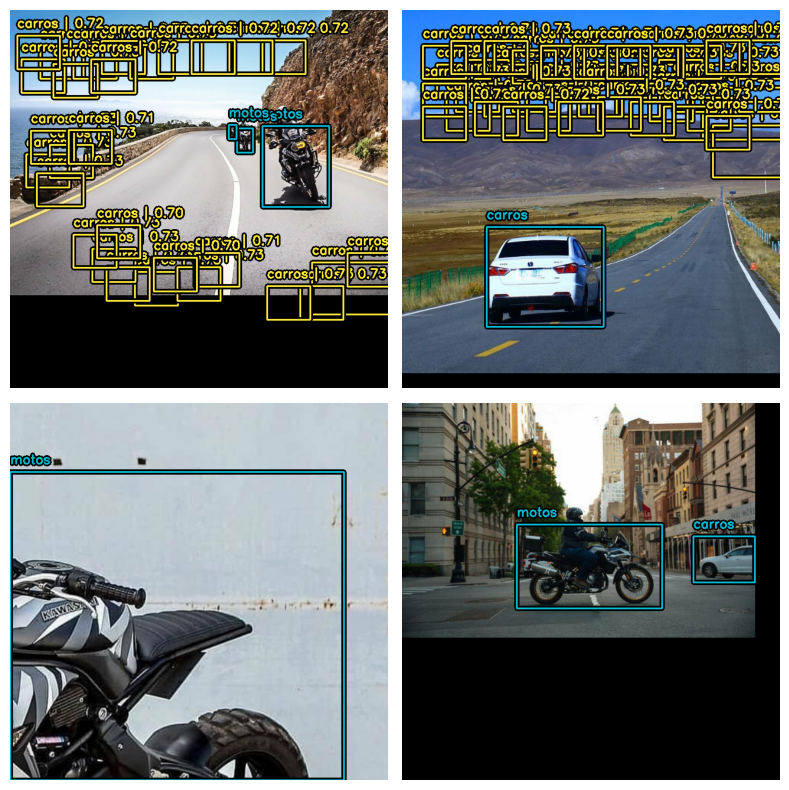

In [ ]:

def visualize_detections(model, dataset, bounding_box_format):
    images, y_true = next(iter(dataset.take(1)))
    y_pred = model.predict(images)
    y_pred = bounding_box.to_ragged(y_pred)
    visualization.plot_bounding_box_gallery(
        images,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_true=y_true,
        y_pred=y_pred,
        scale=4,
        rows=2,
        cols=2,
        show=True,
        font_scale=0.7,
        class_mapping=class_mapping,
    )


visualize_detections(
    yolo8,
    dataset=val_ds,
    bounding_box_format="xyxy",
)

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs/fit

Output hidden; open in https://colab.research.google.com to view.